## Persiapan Data

### Seed

In [1]:
import tensorflow as tf

tf.keras.utils.set_random_seed(42) 

### Helper

In [2]:
# Create helper functions
import urllib.request
url = "https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py"
urllib.request.urlretrieve(url, "helper_functions.py")

# Import series of helper functions for our notebook
# from .helper import ensure_set_name
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir, pred_and_plot

### Load Data 

In [3]:
data_dir = '../data/'

### Membuat Dataframe

In [4]:
import os.path
import pandas as pd

def collect_image_info(directory):
    image_info = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.jpg') or file.endswith('.png') or file.endswith('.jpeg'):
                class_name = os.path.basename(root)
                image_path = os.path.join(root, file)
                image_info.append((image_path, class_name))
    return image_info

data_image_info = collect_image_info(data_dir)

data_df = pd.DataFrame(data_image_info, columns=['image_path', 'class_name'])

In [5]:
data_df

,image_path,class_name
0,../data/amparan-tatak\amparan-tatak-100_ori.jpg,amparan-tatak
1,../data/amparan-tatak\amparan-tatak-101_ori.jpg,amparan-tatak
2,../data/amparan-tatak\amparan-tatak-102_ori.jpg,amparan-tatak
3,../data/amparan-tatak\amparan-tatak-103_ori.jpg,amparan-tatak
4,../data/amparan-tatak\amparan-tatak-104_ori.jpg,amparan-tatak
...,...,...
995,../data/soto-banjar\soto-banjar-95.jpg,soto-banjar
996,../data/soto-banjar\soto-banjar-96.jpg,soto-banjar
997,../data/soto-banjar\soto-banjar-97.jpg,soto-banjar
998,../data/soto-banjar\soto-banjar-98.jpg,soto-banjar


### Visualisasi Data

#### Diagram Data

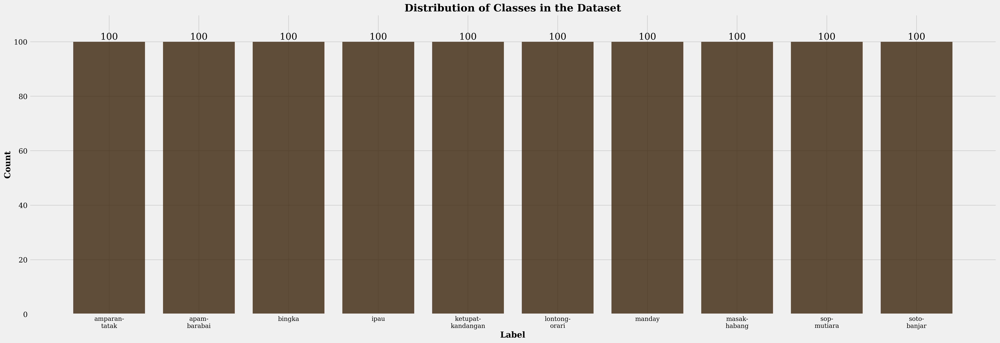

In [6]:
import matplotlib.pyplot as plt
from cycler import cycler
import textwrap

plt.style.use('fivethirtyeight')

# Get the labels
label_counts = data_df['class_name'].value_counts()[:]

# Create a cycler object using the desired colors
color_cycler = (cycler(color=["#3B240B"]))  # Darker coffee brown color

# Set the property cycle of the axes to the created cycler object
plt.rc('axes', prop_cycle=color_cycler)

# Other styling options
plt.rc("font", family="serif", size=18.)
plt.rc("savefig", dpi=200)
plt.rc("legend", loc="best", fontsize="medium", fancybox=True, framealpha=0.5)
plt.rc("lines", linewidth=2.5, markersize=10, markeredgewidth=2.5)

plt.figure(figsize=(30, 10), dpi=300)  # Increase figure size
bars = plt.bar(label_counts.index, label_counts.values, alpha=0.8)
plt.title('Distribution of Classes in the Dataset', fontsize=20, fontweight='bold')
plt.xlabel('Label', fontsize=16, fontweight='bold')
plt.ylabel('Count', fontsize=16, fontweight='bold')

# Wrap x-labels
wrapped_labels = ['\n'.join(textwrap.wrap(label, 10)) for label in label_counts.index]
plt.xticks(range(len(wrapped_labels)), wrapped_labels, fontsize=12, ha='center')  # Change alignment to 'center'

plt.yticks(fontsize=14)

# Adjust y limit to avoid overlapping
plt.ylim(0, max(label_counts) * 1.1)  # Set y limit 10% higher than the max value

# Add value annotations on top of each bar
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.05, int(yval), ha='center', va='bottom')

plt.show()

#### Sample Data

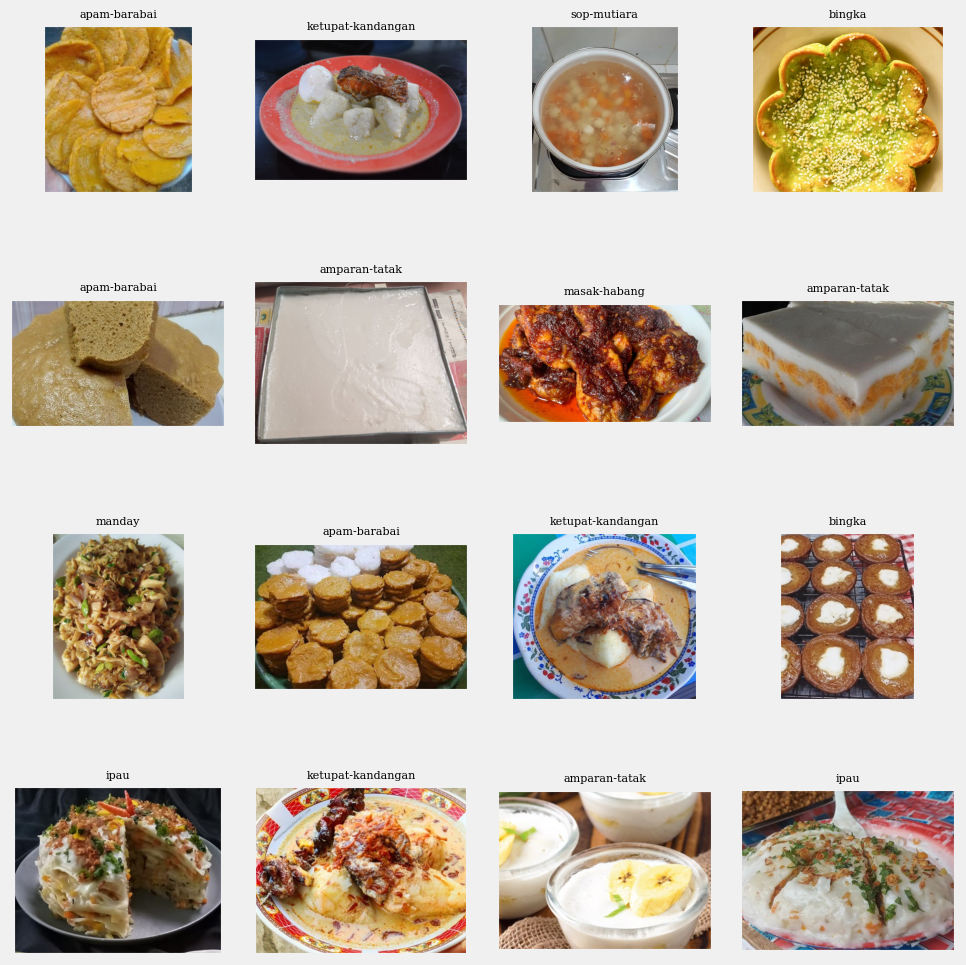

In [7]:
import numpy as np

# Display 16 pictures of the dataset with their labels
random_index = np.random.randint(0, len(data_df), 16)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    image_path = data_df.image_path.iloc[random_index[i]]
    class_name = data_df.class_name.iloc[random_index[i]]
    image = plt.imread(image_path)
    ax.imshow(image)
    title = class_name
    ax.set_title("\n".join(textwrap.wrap(title, 20)), fontsize=8)  # Wrap long titles
plt.tight_layout()
plt.subplots_adjust(hspace=0.5)  # Increase vertical space between subplots
plt.show()

## Model dan Pelatihan

### Generate Data

#### Split Data

In [8]:
train_df = data_df

In [9]:
from sklearn.model_selection import train_test_split

# Shuffle your dataframe for randomness
train_df = train_df.sample(frac=1).reset_index(drop=True)

# Stratified Split (split into 70% train - 20% validation - 10% test)
train_df, test_df = train_test_split(train_df, test_size=0.3, stratify=train_df['class_name'])

val_df, test_df = train_test_split(test_df, test_size=2/3, stratify=test_df['class_name'])  

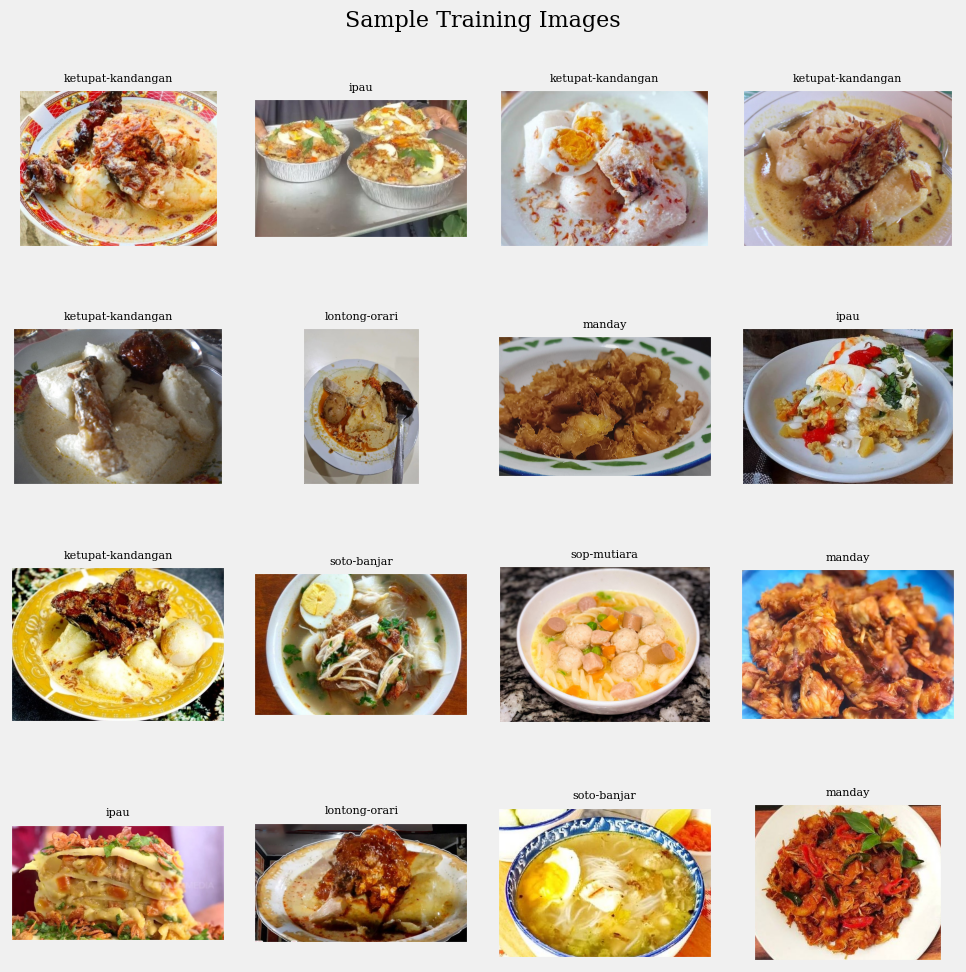

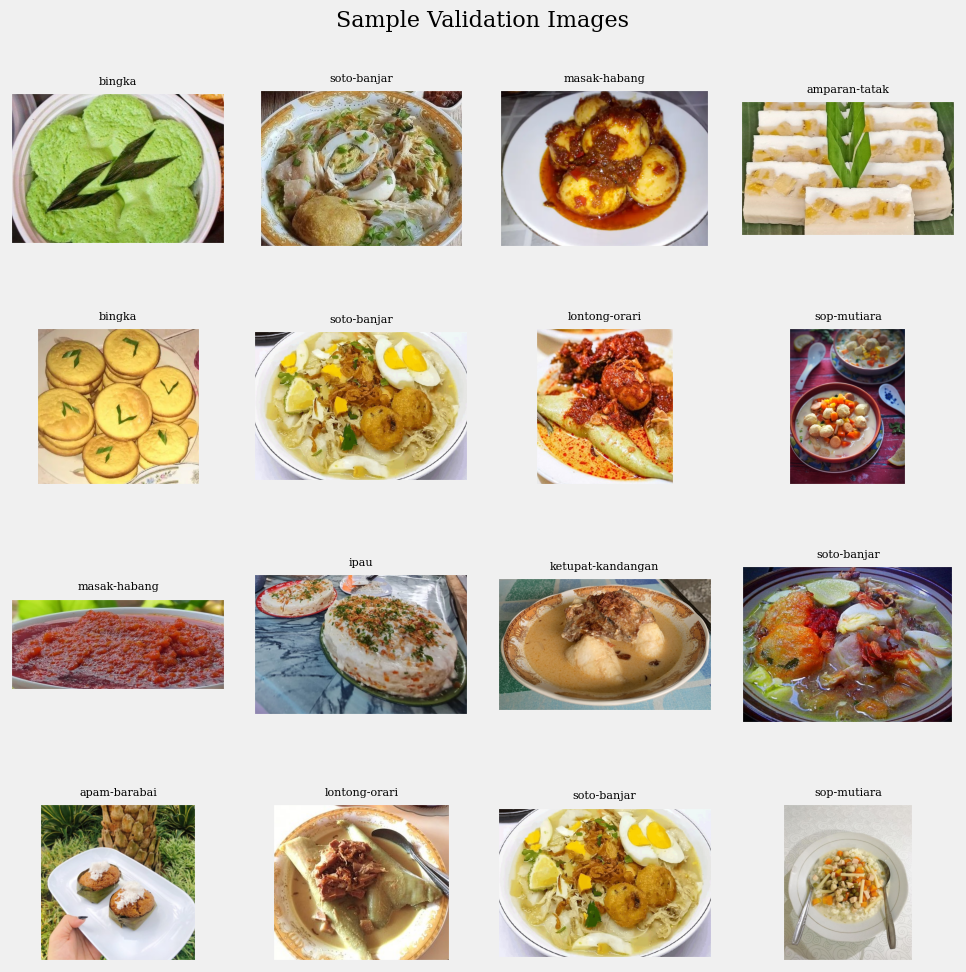

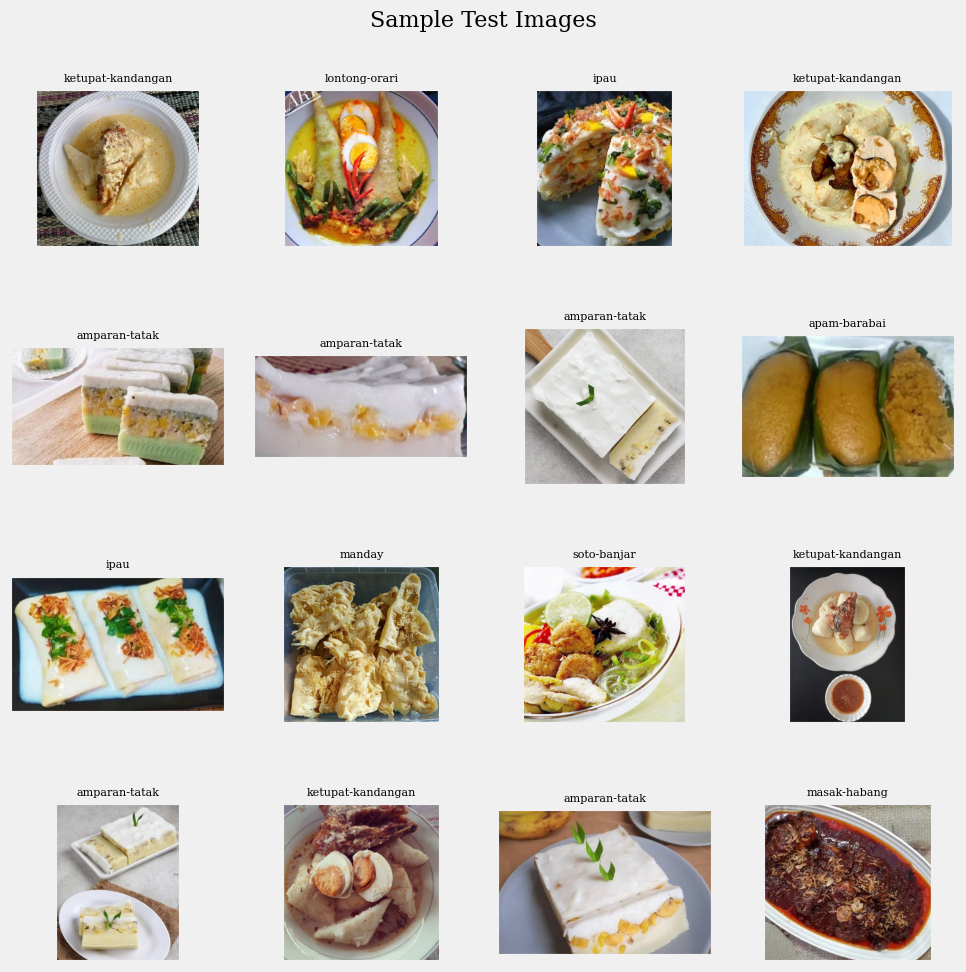

In [10]:
import numpy as np
import matplotlib.pyplot as plt
import textwrap

# Fungsi untuk menampilkan gambar dari dataset
def display_sample_images(data_df, title, num_images=16):
    random_index = np.random.randint(0, len(data_df), num_images)
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                             subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        image_path = data_df.image_path.iloc[random_index[i]]
        class_name = data_df.class_name.iloc[random_index[i]]
        image = plt.imread(image_path)
        ax.imshow(image)
        # Membungkus judul agar tidak terlalu panjang
        wrapped_title = "\n".join(textwrap.wrap(class_name, 20))
        ax.set_title(wrapped_title, fontsize=8)

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9, hspace=0.5)  # Memberi ruang antar subplot
    plt.show()

# Menampilkan sample gambar dari masing-masing dataset
display_sample_images(train_df, title="Sample Training Images")
display_sample_images(val_df, title="Sample Validation Images")
display_sample_images(test_df, title="Sample Test Images")


#### Generator Data

In [11]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Separate in train and test data
train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    rotation_range=10,         # Equivalent to RandomRotation(0.1)
    horizontal_flip=True,      # Equivalent to RandomFlip("horizontal")
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
)

In [12]:
### Now use train_df with train_images generator and val_df with val_images generator without the subset parameter
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='image_path',
    y_col='class_name',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42
)

val_images = test_generator.flow_from_dataframe(
    dataframe=val_df,
    x_col='image_path',
    y_col='class_name',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=True,
    seed=42
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='image_path',
    y_col='class_name',
    target_size=(224, 224),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=32,
    shuffle=False
)

Found 700 validated image filenames belonging to 10 classes.
Found 100 validated image filenames belonging to 10 classes.
Found 200 validated image filenames belonging to 10 classes.


Gambar telah disimpan ke saved-images\sample_training_images.png


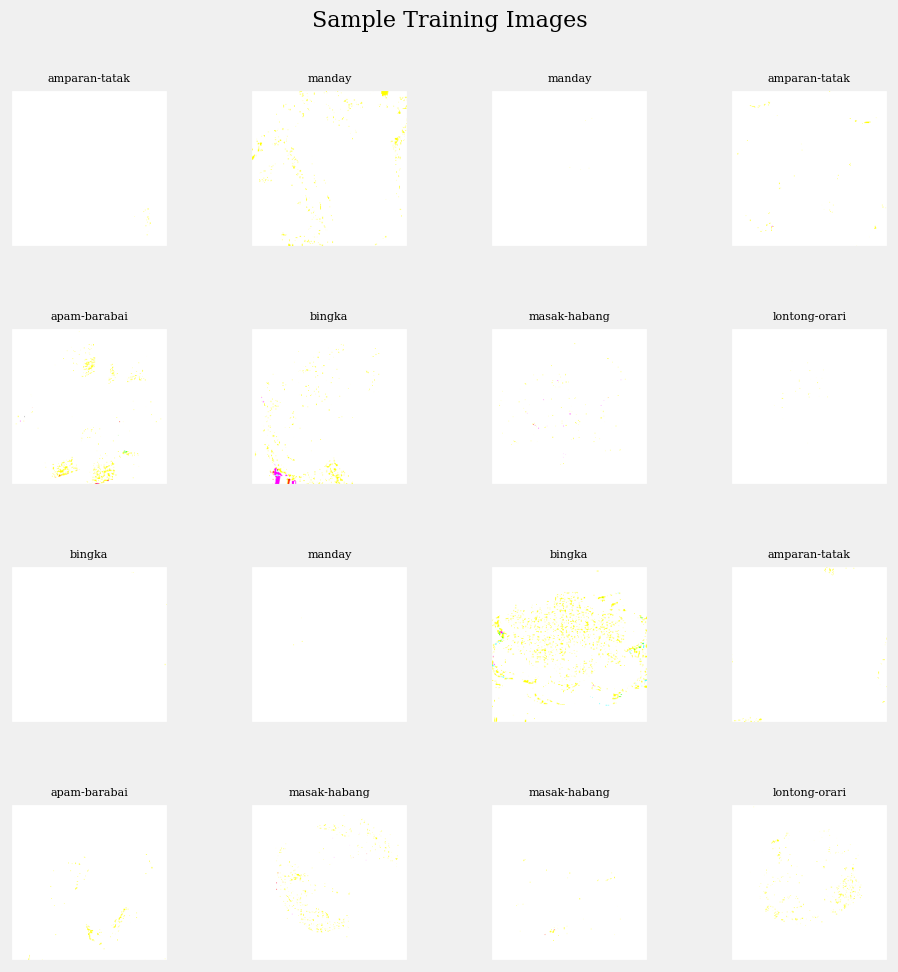

In [13]:
import os
import numpy as np
import matplotlib.pyplot as plt
import textwrap

# Fungsi untuk menampilkan gambar dari generator dan menyimpannya ke folder
def display_sample_images_from_generator(generator, title, num_images=16, save_path="saved-images", save_filename="sample_training_images.png"):
    images, labels = next(generator)  # Ambil satu batch gambar dan label
    num_images = min(num_images, len(images))  # Pastikan tidak lebih dari jumlah gambar dalam batch
    
    # Normalisasi gambar ke rentang [0, 1] jika diperlukan
    images = np.clip(images, 0, 1)
    
    fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                             subplot_kw={'xticks': [], 'yticks': []})

    for i, ax in enumerate(axes.flat):
        if i < num_images:
            ax.imshow(images[i])
            # Menentukan label berdasarkan indeks kelas
            class_index = np.argmax(labels[i])
            class_name = list(generator.class_indices.keys())[class_index]
            # Membungkus judul agar tidak terlalu panjang
            wrapped_title = "\n".join(textwrap.wrap(class_name, 20))
            ax.set_title(wrapped_title, fontsize=8)

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9, hspace=0.5)  # Memberi ruang antar subplot

    # Buat direktori jika belum ada
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    # Simpan gambar ke dalam folder yang ditentukan
    save_full_path = os.path.join(save_path, save_filename)
    plt.savefig(save_full_path)  # Simpan gambar ke dalam folder
    print(f"Gambar telah disimpan ke {save_full_path}")

    plt.show()

# Menampilkan dan menyimpan sample gambar dari generator
display_sample_images_from_generator(train_images, title="Sample Training Images")


### Mendifinisikan Early Stop

In [14]:
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau

# Create checkpoint callback
checkpoint_path = "saved-models/trained-model-{epoch:02d}-{val_accuracy:.2f}.keras"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=False,
                                      monitor="val_accuracy",
                                      save_best_only=False)

# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 5,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

### Memuat Layer

In [15]:
from tensorflow.keras.models import Model

# Load the pretained model
pretrained_model = tf.keras.applications.efficientnet.EfficientNetB0(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)

# Freeze the layers of the pre-trained model
pretrained_model.trainable = True

# Optionally, freeze the first few layers
for layer in pretrained_model.layers[:-30]:  # Freeze all layers except the last 20
    layer.trainable = False

In [16]:
# Loop through all layers in the pre-trained model
for i, layer in enumerate(pretrained_model.layers):
    print(f"{i}: {layer.name}, trainable: {layer.trainable}")


0: input_layer, trainable: False
1: rescaling, trainable: False
2: normalization, trainable: False
3: rescaling_1, trainable: False
4: stem_conv_pad, trainable: False
5: stem_conv, trainable: False
6: stem_bn, trainable: False
7: stem_activation, trainable: False
8: block1a_dwconv, trainable: False
9: block1a_bn, trainable: False
10: block1a_activation, trainable: False
11: block1a_se_squeeze, trainable: False
12: block1a_se_reshape, trainable: False
13: block1a_se_reduce, trainable: False
14: block1a_se_expand, trainable: False
15: block1a_se_excite, trainable: False
16: block1a_project_conv, trainable: False
17: block1a_project_bn, trainable: False
18: block2a_expand_conv, trainable: False
19: block2a_expand_bn, trainable: False
20: block2a_expand_activation, trainable: False
21: block2a_dwconv_pad, trainable: False
22: block2a_dwconv, trainable: False
23: block2a_bn, trainable: False
24: block2a_activation, trainable: False
25: block2a_se_squeeze, trainable: False
26: block2a_se_res

In [17]:
# Data Augmentation Step
augment = tf.keras.Sequential([
  tf.keras.layers.Resizing(224,224),
  tf.keras.layers.RandomContrast(0.1),
])

In [18]:
from keras.layers import Dense, Dropout

# Existing model structure
inputs = pretrained_model.input
x = augment(inputs)
x = Dense(128, activation='relu')(pretrained_model.output)
x = Dropout(0.45)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.45)(x)
outputs = Dense(10, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling (Rescaling)         │ (None, 224, 224, 3)       │               0 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ normalization (Normalization) │ (None, 224, 224, 3)       │               7 │ rescaling[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling_1 (Rescaling)       │ (None, 224, 224, 3)       │               0 │ normalization[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv_pad (ZeroPadding2D) │ (None, 225, 225, 3)       │               0 │ rescaling_1[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv (Conv2D)            │ (None, 112, 112, 32)      │             864 │ stem_conv_pad[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_bn (BatchNormalization)  │ (None, 112, 112, 32)      │             128 │ stem_conv[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_activation (Activation)  │ (None, 112, 112, 32)      │               0 │ stem_bn[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_dwconv                │ (None, 112, 112, 32)      │             288 │ stem_activation[0][0]      │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_bn                    │ (None, 112, 112, 32)      │             128 │ block1a_dwconv[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_activation            │ (None, 112, 112, 32)      │               0 │ block1a_bn[0][0]           │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_squeeze            │ (None, 32)                │               0 │ block1a_activation[0][0]   │
│ (GlobalAveragePooling2D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reshape (Reshape)  │ (None, 1, 1, 32)          │               0 │ block1a_se_squeeze[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reduce (Conv2D)    │ (None, 1, 1, 8)           │             264 │ block1a_se_reshape[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_expand (Conv2D)    │ (None, 1, 1, 32)          │             288 │ block1a_se_reduce[0][0]    │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 4,249,133 (16.21 MB)

 Trainable params: 1,693,418 (6.46 MB)

 Non-trainable params: 2,555,715 (9.75 MB)

### Kompilasi Model

In [19]:
from tensorflow.keras.optimizers import Adam

# Compile with custom F1-Score
model.compile(
    optimizer=Adam(0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

### Latih Model

In [20]:
history = model.fit(
    train_images,
    steps_per_epoch=None,
    validation_data=val_images,
    validation_steps=None,
    epochs=100,
    callbacks=[
        early_stopping,
        create_tensorboard_callback("training_logs", "mld_classification"),
        checkpoint_callback,
        reduce_lr
    ]
)

Saving TensorBoard log files to: training_logs/mld_classification/20241202-164708
Epoch 1/100


C:\Users\User\AppData\Local\Programs\Python\Python312\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


22/22 ━━━━━━━━━━━━━━━━━━━━ 68s 2s/step - accuracy: 0.1370 - loss: 4.2836 - val_accuracy: 0.2900 - val_loss: 2.1596 - learning_rate: 0.0010
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.2258 - loss: 2.1124 - val_accuracy: 0.4700 - val_loss: 1.6249 - learning_rate: 0.0010
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.3758 - loss: 1.7565 - val_accuracy: 0.7000 - val_loss: 1.1415 - learning_rate: 0.0010
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step - accuracy: 0.5394 - loss: 1.2973 - val_accuracy: 0.7700 - val_loss: 0.7598 - learning_rate: 0.0010
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 47s 2s/step - accuracy: 0.5794 - loss: 1.1985 - val_accuracy: 0.7800 - val_loss: 0.5867 - learning_rate: 0.0010
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - accuracy: 0.6544 - loss: 1.0722 - val_accuracy: 0.8700 - val_loss: 0.4885 - learning_rate: 0.0010
Epoch 7/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 35s 1s/step - accuracy: 0.7261 - loss: 0.8268 - val_accuracy: 0.910

In [21]:
model.save("my_model.keras")

### Hasil 

Plot telah disimpan ke saved-images\training_validation_plots.png


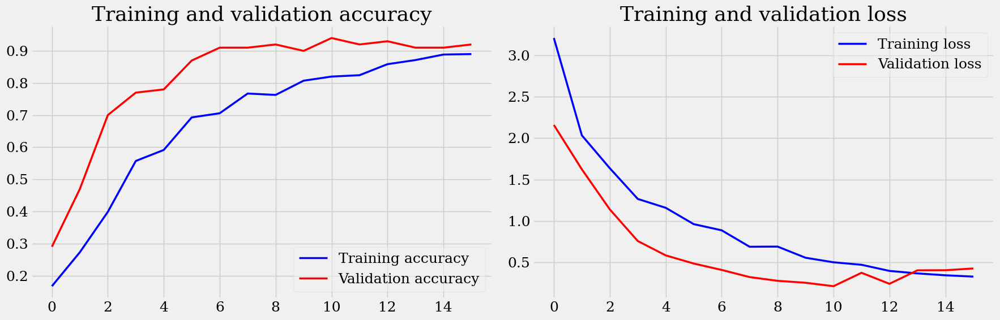

In [22]:
# Extracting F1-score from the history object
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(accuracy))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))  # Create a 1x3 grid of plots

# Plot accuracy
ax1.plot(epochs, accuracy, 'b', label='Training accuracy')
ax1.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.legend()

# Plot loss
ax2.plot(epochs, loss, 'b', label='Training loss')
ax2.plot(epochs, val_loss, 'r', label='Validation loss')
ax2.set_title('Training and validation loss')
ax2.legend()

plt.tight_layout()  # Adjust the padding between and around the subplots

# Save plot to 'saved-images' folder
save_path = "saved-images"
if not os.path.exists(save_path):
    os.makedirs(save_path)

save_filename = "training_validation_plots.png"
save_full_path = os.path.join(save_path, save_filename)
plt.savefig(save_full_path)
print(f"Plot telah disimpan ke {save_full_path}")

plt.show()

## Evaluasi

### Memuat Model 

In [23]:
results = model.evaluate(test_images, verbose=0)
print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.22855
Test Accuracy: 92.00%


In [24]:
from tensorflow.keras.models import load_model

# Load the best model
best_model_path = 'my_model.keras'  # Replace with your best model path
model = load_model(best_model_path)

results = model.evaluate(test_images, verbose=0)
print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))
# print("  Test F1-score: {:.2f}%".format(results[2] * 100))


    Test Loss: 0.20408
Test Accuracy: 94.50%


In [25]:
# Predict the label of the test_images
pred = model.predict(test_images)
pred = np.argmax(pred,axis=1)

# Map the labelz
labels = (train_images.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

# Display the result
print(f'The first 5 predictions: {pred[:5]}')

7/7 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step 
The first 5 predictions: ['masak-habang', 'sop-mutiara', 'sop-mutiara', 'manday', 'manday']


Plot telah disimpan ke saved-images\testing-image


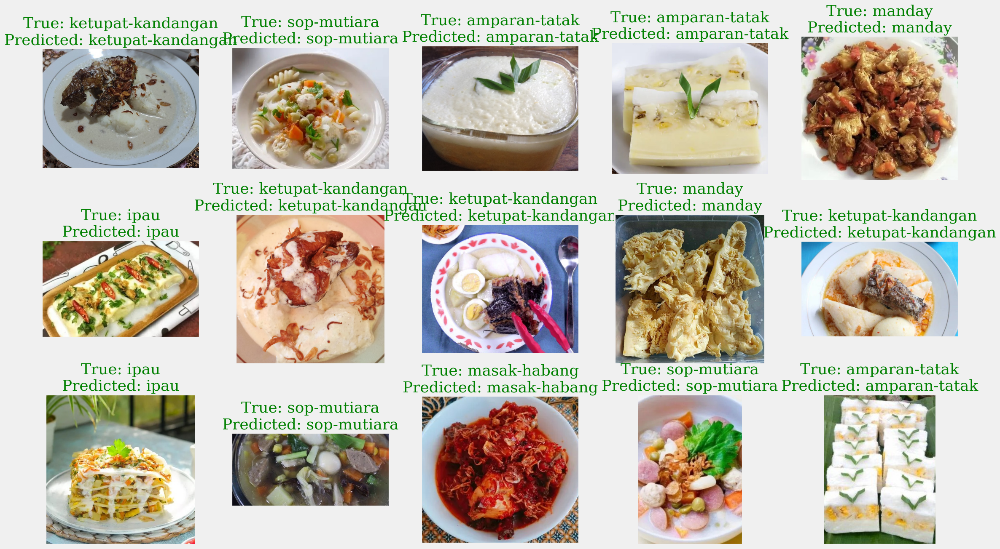

<Figure size 640x480 with 0 Axes>

In [26]:
# Display 25 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.image_path.iloc[random_index[i]]))
    if test_df.class_name.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.class_name.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)

# Save plot to 'saved-images' folder
save_path = "saved-images"
if not os.path.exists(save_path):
    os.makedirs(save_path)

save_filename = "testing-image"
save_full_path = os.path.join(save_path, save_filename)
plt.savefig(save_full_path)
print(f"Plot telah disimpan ke {save_full_path}")

plt.show()
plt.tight_layout()

Class amparan-tatak:
Precision: ['0.1000', '1.0000', '1.0000']
Recall: ['1.0000', '0.9000', '0.0000']
Average Precision: 0.9100

Class apam-barabai:
Precision: ['0.1000', '0.8696', '1.0000']
Recall: ['1.0000', '1.0000', '0.0000']
Average Precision: 0.8696

Class bingka:
Precision: ['0.1000', '1.0000', '1.0000']
Recall: ['1.0000', '0.9000', '0.0000']
Average Precision: 0.9100

Class ipau:
Precision: ['0.1000', '1.0000', '1.0000']
Recall: ['1.0000', '0.8500', '0.0000']
Average Precision: 0.8650

Class ketupat-kandangan:
Precision: ['0.1000', '1.0000', '1.0000']
Recall: ['1.0000', '1.0000', '0.0000']
Average Precision: 1.0000

Class lontong-orari:
Precision: ['0.1000', '1.0000', '1.0000']
Recall: ['1.0000', '1.0000', '0.0000']
Average Precision: 1.0000

Class manday:
Precision: ['0.1000', '0.8947', '1.0000']
Recall: ['1.0000', '0.8500', '0.0000']
Average Precision: 0.7755

Class masak-habang:
Precision: ['0.1000', '0.9091', '1.0000']
Recall: ['1.0000', '1.0000', '0.0000']
Average Precisio

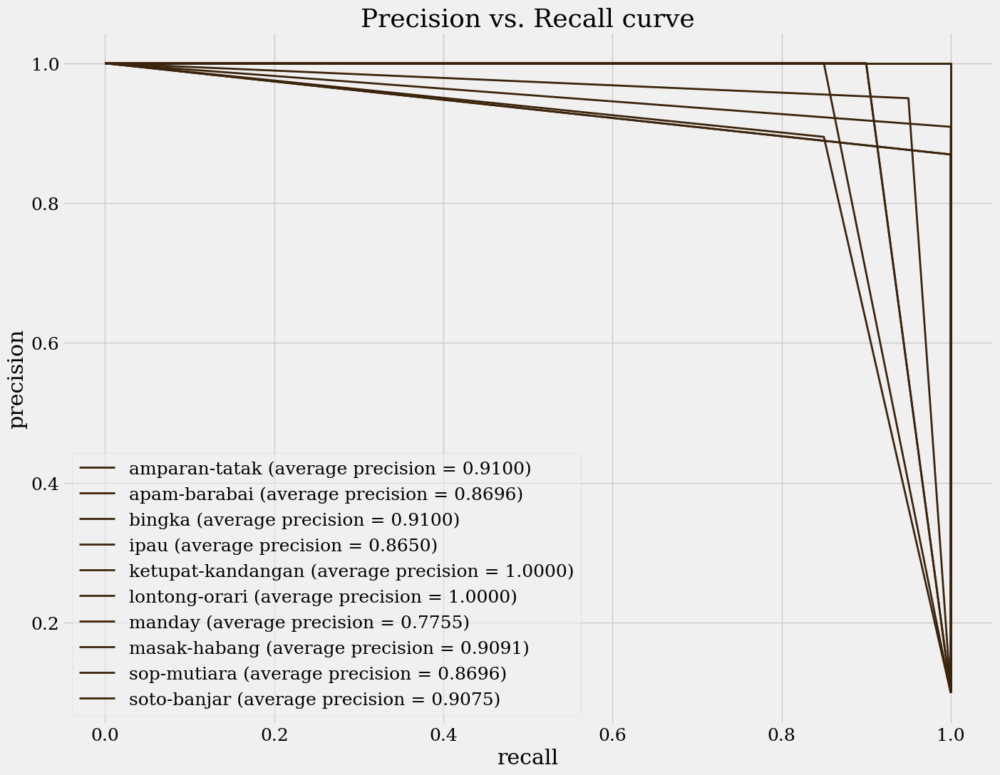

In [27]:
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import precision_recall_curve, average_precision_score

# Convert labels to one-hot encoding
lb = LabelBinarizer()
y_true_onehot = lb.fit_transform(test_df.class_name)

# Convert predictions to one-hot encoding
y_pred_onehot = lb.transform(pred)

# For storing average precision for each class
average_precision = {}

# Get class names
class_names = lb.classes_

# Plot PR curve for each class
n_classes = y_true_onehot.shape[1]
plt.figure(figsize=(15, 12))

for i in range(n_classes):
    precision, recall, _ = precision_recall_curve(y_true_onehot[:, i], y_pred_onehot[:, i])
    average_precision[i] = average_precision_score(y_true_onehot[:, i], y_pred_onehot[:, i])
    
    # Printing the precision and recall values for each class using the actual class names
    print(f"Class {class_names[i]}:")
    print("Precision:", [f"{p:.4f}" for p in precision])
    print("Recall:",  [f"{r:.4f}" for r in recall])
    print(f"Average Precision: {average_precision[i]:.4f}\n")
    
    plt.plot(recall, precision, lw=2, label=f'{class_names[i]} (average precision = {average_precision[i]:0.4f})')

plt.xlabel("recall")
plt.ylabel("precision")
plt.legend(loc="best")
plt.title("Precision vs. Recall curve")
plt.grid(True)

# Save plot to 'saved-images' folder
save_path = "saved-images"
if not os.path.exists(save_path):
    os.makedirs(save_path)

save_filename = "confusion-matrix"
save_full_path = os.path.join(save_path, save_filename)
plt.savefig(save_full_path)
print(f"Plot telah disimpan ke {save_full_path}")

plt.show()

In [28]:
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Menghasilkan classification report dalam bentuk dictionary
y_test = list(test_df.class_name)
report = classification_report(y_test, pred, output_dict=True)

# Membuat DataFrame dari report
df = pd.DataFrame(report).transpose()

# Membuat confusion matrix untuk menghitung accuracy per kelas
cm = confusion_matrix(y_test, pred, labels=list(df.index[:-3]))  # Ambil label tanpa avg/accuracy

# Menghitung akurasi per kelas: diagonal (prediksi benar) dibagi jumlah total per kelas
accuracy_per_class = cm.diagonal() / cm.sum(axis=1)

# Menambahkan kolom 'accuracy' ke DataFrame
df = df.iloc[:-3]  # Menghilangkan baris 'accuracy', 'macro avg', 'weighted avg' sementara
df['accuracy'] = accuracy_per_class

# Tambahkan kembali avg dan accuracy
df.loc['accuracy'] = report['accuracy']
df.loc['macro avg'] = pd.Series(report['macro avg'])
df.loc['weighted avg'] = pd.Series(report['weighted avg'])
df = df.drop(index='accuracy')
# Jika ingin menampilkan dalam Jupyter Notebook
df

,precision,recall,f1-score,support,accuracy
amparan-tatak,1.000000,0.900,0.947368,20.0,0.90
apam-barabai,0.869565,1.000,0.930233,20.0,1.00
bingka,1.000000,0.900,0.947368,20.0,0.90
ipau,1.000000,0.850,0.918919,20.0,0.85
ketupat-kandangan,1.000000,1.000,1.000000,20.0,1.00
lontong-orari,1.000000,1.000,1.000000,20.0,1.00
manday,0.894737,0.850,0.871795,20.0,0.85
masak-habang,0.909091,1.000,0.952381,20.0,1.00
sop-mutiara,0.869565,1.000,0.930233,20.0,1.00
soto-banjar,0.950000,0.950,0.950000,20.0,0.95


Plot telah disimpan ke saved-images\heatmap


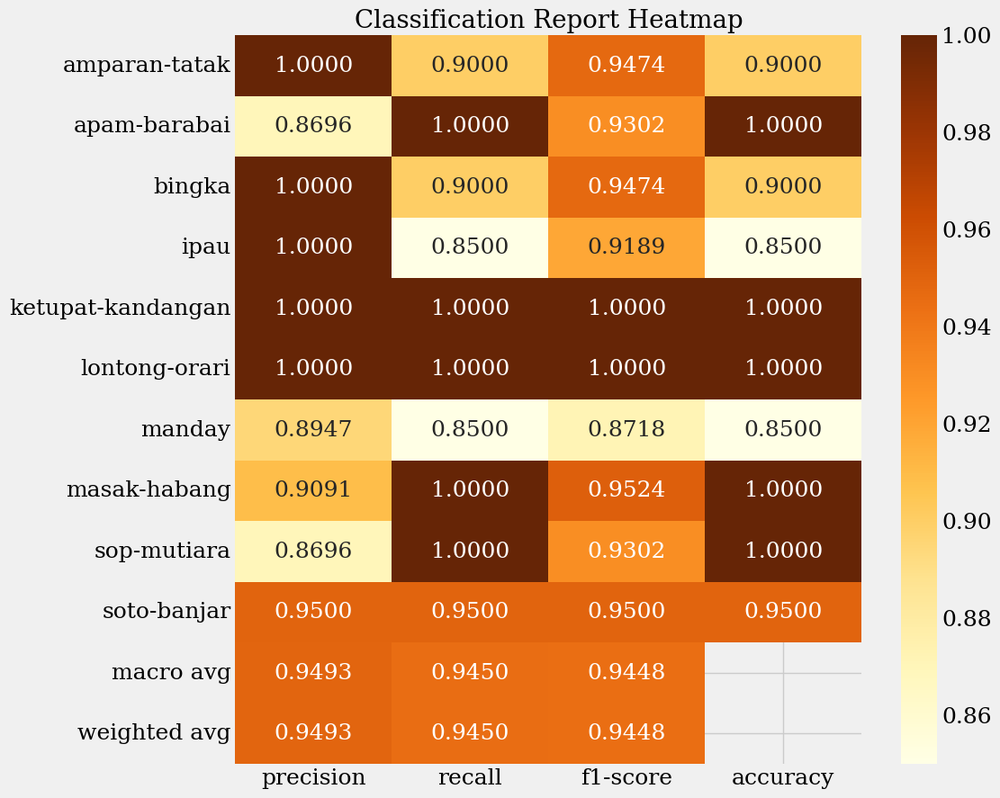

In [29]:
import seaborn as sns

# Remove the 'support' column
df = df.drop(['support'], axis=1)

plt.figure(figsize=(10, 10))
sns.heatmap(df, annot=True, cmap='YlOrBr', fmt='.4f')
plt.title('Classification Report Heatmap', fontsize=20)

# Save plot to 'saved-images' folder
save_path = "saved-images"
if not os.path.exists(save_path):
    os.makedirs(save_path)

save_filename = "heatmap"
save_full_path = os.path.join(save_path, save_filename)
plt.savefig(save_full_path)
print(f"Plot telah disimpan ke {save_full_path}")

plt.show()

Plot telah disimpan ke saved-images/confusion_matrix.png


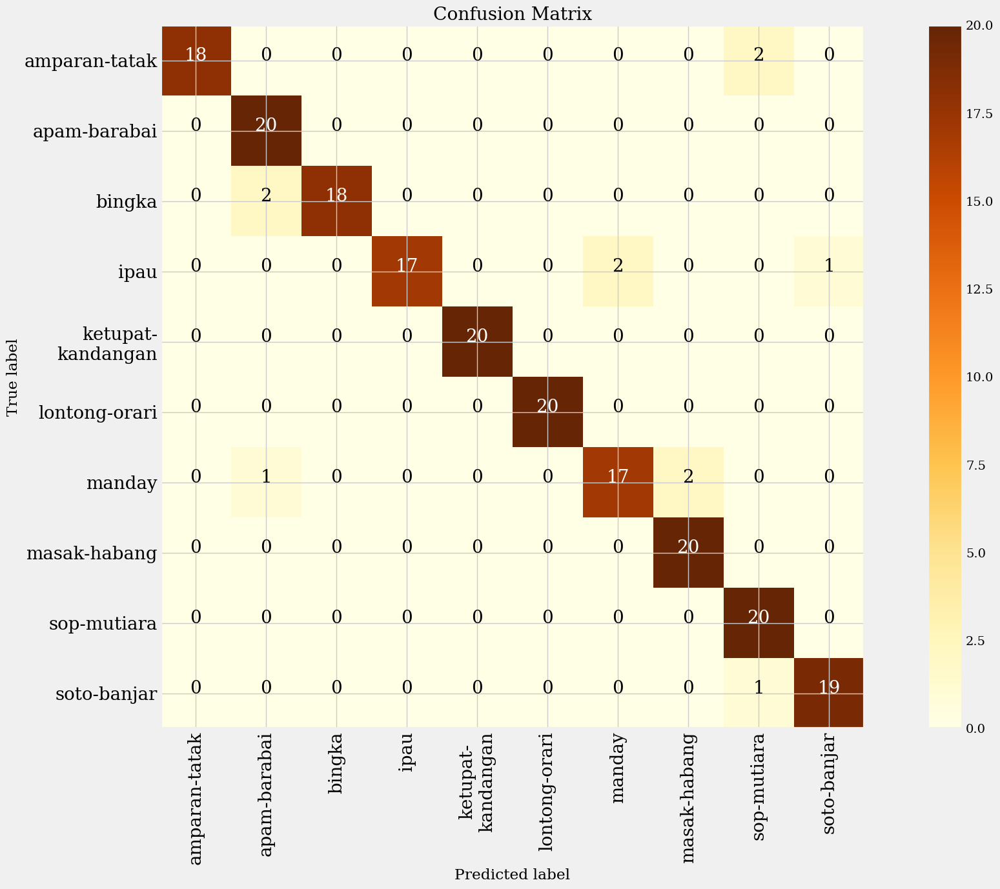

In [30]:
import itertools
import textwrap

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(20, 14), text_size=20, norm=False, savefig=False, save_path="confusion_matrix.png", wrap_length=15): 
    
    # Use the fivethirtyeight style
    plt.style.use('fivethirtyeight')
    cm = confusion_matrix(y_true, y_pred)
    cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
    n_classes = cm.shape[0] # find the number of classes we're dealing with

    # Plot the figure and make it pretty
    fig, ax = plt.subplots(figsize=figsize)
    cax = ax.matshow(cm, cmap=plt.cm.YlOrBr) # colors will represent how 'correct' a class is, darker == better
    fig.colorbar(cax)

    # Are there a list of classes?
    if classes:
        # Apply text wrapping to labels
        labels = [textwrap.fill(label, wrap_length) for label in classes]
    else:
        labels = np.arange(cm.shape[0])
  
    # Label the axes
    ax.set(title="Confusion Matrix",
           xlabel="Predicted label",
           ylabel="True label",
           xticks=np.arange(n_classes), # create enough axis slots for each class
           yticks=np.arange(n_classes), 
           xticklabels=labels, # axes will be labeled with wrapped class names (if they exist) or ints
           yticklabels=labels)
  
    # Make x-axis labels appear on bottom
    ax.xaxis.set_label_position("bottom")
    ax.xaxis.tick_bottom()
    plt.xticks(rotation=90, fontsize=text_size)
    plt.yticks(fontsize=text_size)

    # Set the threshold for different colors
    threshold = (cm.max() + cm.min()) / 2.

    # Plot the text on each cell
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if norm:
            plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
                     horizontalalignment="center",
                     color="white" if cm[i, j] > threshold else "black",
                     size=text_size)
        else:
            plt.text(j, i, f"{cm[i, j]}",
                     horizontalalignment="center",
                     color="white" if cm[i, j] > threshold else "black",
                     size=text_size)

    # Adjust layout to prevent cutting off labels
    plt.tight_layout()

    # Save the figure to the specified path
    if savefig:
        fig.savefig(save_path, bbox_inches="tight")  # Use bbox_inches to ensure no parts are cut off
        print(f"Plot telah disimpan ke {save_path}")

# Contoh penggunaan fungsi:
make_confusion_matrix(y_test, pred, list(labels.values()), savefig=True, save_path="saved-images/confusion_matrix.png")


Plot telah disimpan ke saved-images\misclassified-samples


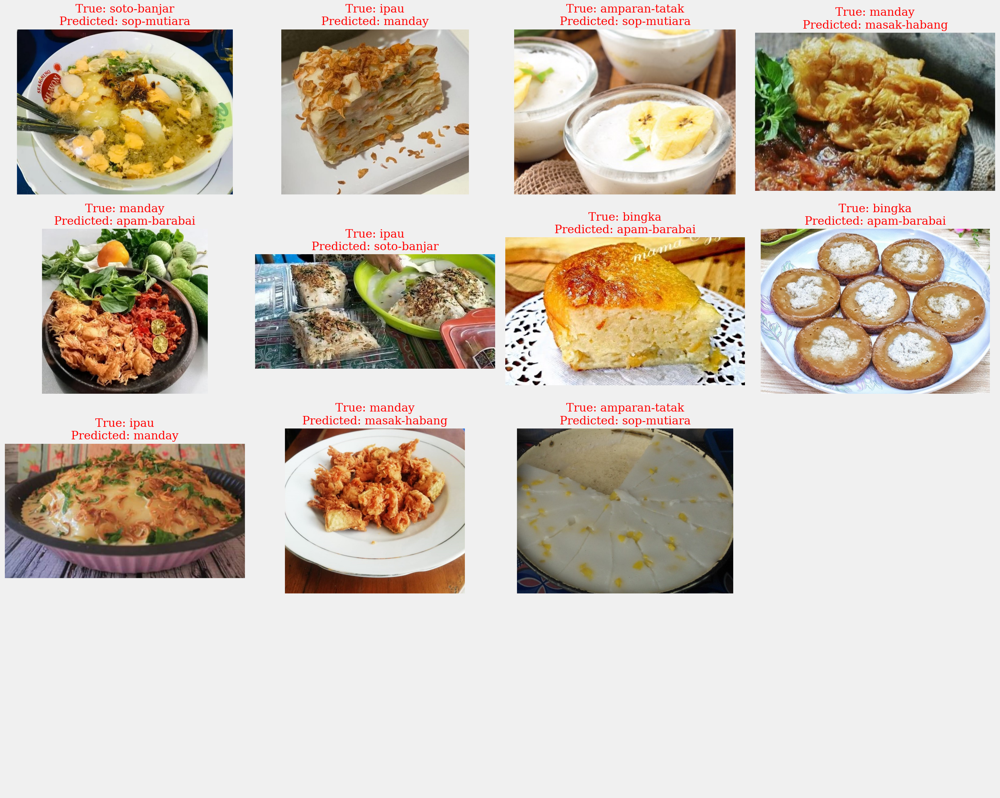

In [34]:
# Filter samples with incorrect predictions
misclassified_indices = [i for i in range(len(test_df)) if test_df.class_name.iloc[i] != pred[i]]

# Randomly sample up to 25 misclassified indices
random_indices = np.random.choice(misclassified_indices, size=min(25, len(misclassified_indices)), replace=False)

# Create subplots
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(25, 20),
                         subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    if i < len(random_indices):
        idx = random_indices[i]
        ax.imshow(plt.imread(test_df.image_path.iloc[idx]))
        ax.set_title(
            f"True: {test_df.class_name.iloc[idx]}\nPredicted: {pred[idx]}",
            color="red"
        )
    else:
        ax.axis("off")  # Hide empty subplots

# Save plot to 'saved-images' folder
save_path = "saved-images"
if not os.path.exists(save_path):
    os.makedirs(save_path)

save_filename = "misclassified-samples"
save_full_path = os.path.join(save_path, save_filename)
plt.savefig(save_full_path)
print(f"Plot telah disimpan ke {save_full_path}")

plt.tight_layout()
plt.show()
